# Import and Cleaning

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score

import matplotlib.pyplot as plt

In [2]:
# read data
df_music = pd.read_csv('five_k.csv')

# some cleaning
df_music = df_music.replace(r"^ +| +$", r"", regex=True)
df_music = df_music.rename(columns=lambda x: x.strip())

# drop useless cols
df_music = df_music.drop(columns=['Unnamed: 0', 'duration_ms', 'type', 'id', 'html'])
df_music.head(8)

# drop duplicate rows
#df_music.duplicated().value_counts()
df_music = df_music.drop_duplicates()

In [3]:
df_music.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000,5164.000000
mean,0.507494,0.653254,5.263555,-9.379017,0.647366,0.083137,0.291425,0.260512,0.185539,0.442185,118.657748,3.901627
std,0.218142,0.289502,3.572071,6.316775,0.477836,0.070968,0.356872,0.371906,0.149653,0.277946,28.597810,0.422133
min,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.306000,0.475000,2.000000,-11.385250,0.000000,0.038900,0.002270,0.000001,0.092500,0.195000,96.069750,4.000000
50%,0.536000,0.738000,5.000000,-7.361500,1.000000,0.055700,0.096200,0.002210,0.125000,0.414000,119.011500,4.000000
75%,0.686000,0.895000,8.000000,-5.297500,1.000000,0.098800,0.570250,0.657250,0.237000,0.676000,134.038250,4.000000
max,0.967000,1.000000,11.000000,1.342000,1.000000,0.918000,0.996000,0.985000,0.987000,0.985000,213.990000,5.000000


In [4]:
def filter_outliers(df, col_list):
    for col in col_list:#metrics:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        df = df.loc[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
        return df

df_music = filter_outliers(df_music, ['speechiness', 'loudness', 'tempo'])

In [5]:
df_music.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000
mean,0.500837,0.641658,5.249313,-9.659994,0.651173,0.065995,0.304556,0.272668,0.183398,0.438528,118.401558,3.896049
std,0.215020,0.294959,3.562680,6.475155,0.476650,0.037584,0.364968,0.377145,0.146634,0.278197,27.980695,0.430469
min,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.304000,0.451000,2.000000,-11.773000,0.000000,0.037900,0.002320,0.000002,0.092600,0.194000,96.814000,4.000000
50%,0.528000,0.729000,5.000000,-7.613000,1.000000,0.051600,0.103000,0.003550,0.124000,0.402000,119.427000,4.000000
75%,0.675000,0.890000,8.000000,-5.390000,1.000000,0.084000,0.623000,0.703000,0.233000,0.673000,133.450000,4.000000
max,0.967000,1.000000,11.000000,1.342000,1.000000,0.188000,0.996000,0.985000,0.987000,0.985000,213.990000,5.000000


# Split data

in two dfs, one containing text info (title, interpreter, etc.) and another one with useful numerical data

In [6]:
metrics = ['danceability', 'energy', 
           'key',
           'loudness', 
           'mode', 
           'speechiness', 
           'acousticness', 'instrumentalness', 
           'liveness', 
           'valence', 'tempo', #'time_signature'
          ]

In [7]:
df_general = df_music.loc[:, ~df_music.columns.isin(metrics)].copy()
df = df_music.loc[:, df_music.columns.isin(metrics)].copy()

#df_general.head()
#df.head()

In [8]:
#df.describe()

# Data scaling

In [9]:
# Initialise the transformer (optionally, set parameters)
min_max = MinMaxScaler().set_output(transform="pandas")

# Use the transformer to transform the data
scaled_df = min_max.fit_transform(df)
scaled_df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.680455,0.2590,1.000000,0.763897,0.0,0.375000,0.696787,0.000060,0.987842,0.310660,0.515800
1,0.767322,0.3990,0.181818,0.771967,1.0,0.184043,0.217871,0.000002,0.108409,0.703553,0.584322
3,0.729059,0.0502,0.363636,0.682811,1.0,0.250532,0.882530,0.000041,0.391084,0.531980,0.499098
4,0.673216,0.1190,0.545455,0.655228,1.0,0.202128,0.919679,0.000348,0.105370,0.408122,0.565171
5,0.481903,0.1460,0.272727,0.692837,1.0,0.345213,0.934739,0.156345,0.108409,0.429442,0.667718


In [10]:
scaled_df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000,4733.000000
mean,0.517929,0.641658,0.477210,0.820645,0.651173,0.351037,0.305779,0.276820,0.185814,0.445206,0.553304
std,0.222358,0.294959,0.323880,0.105558,0.476650,0.199915,0.366433,0.382888,0.148566,0.282433,0.130757
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.314374,0.451000,0.181818,0.786199,0.000000,0.201596,0.002329,0.000002,0.093820,0.196954,0.452423
50%,0.546019,0.729000,0.454545,0.854015,1.000000,0.274468,0.103414,0.003604,0.125633,0.408122,0.558096
75%,0.698035,0.890000,0.727273,0.890255,1.000000,0.446809,0.625502,0.713706,0.236069,0.683249,0.623627
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
### Alternative scaling
# Number of samples
#number_of_samples = df.shape[0]

# Create a QuantileTransformer object
#quant_trans = QuantileTransformer(n_quantiles = number_of_samples).set_output(transform="pandas")

# Transform the DataFrame
#scaled_df2 = quant_trans.fit_transform(df)

#scaled_df2.describe()

# Exploratory clustering

Perform first round of clustering to identify the main distinctive variables and define the major clusters.

In [12]:
wcss = []
clusters = []
silhouettes = []

for k in range(2, 30):
    kmeans = KMeans(n_clusters=k, 
                    #init='random',
                    init='k-means++',
                    n_init=10,
                    #n_init='auto',
                    max_iter=300,
                    random_state=101)
    kmeans.fit(scaled_df)
    wcss.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(scaled_df, kmeans.labels_))
    clusters.append(k)
    #print(kmeans.n_iter_)

#print(clusters, wcss)

In [13]:
slope = np.diff(wcss)
curve = np.diff(slope)
elbow = np.argmax(curve) + 1
print(clusters[elbow])

3


Text(0, 0.5, 'silhouette score')

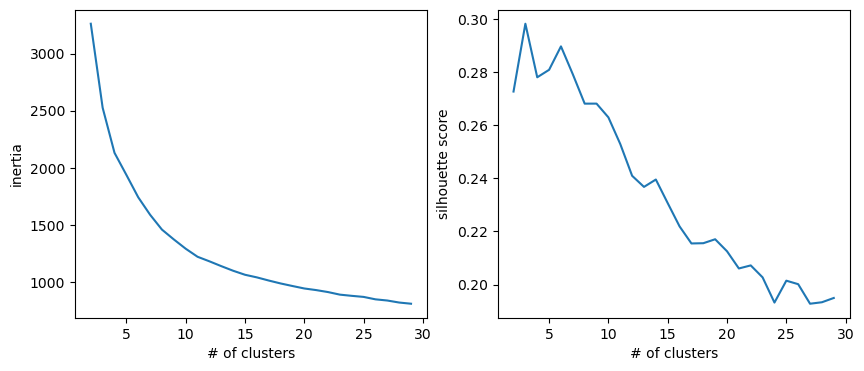

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

axs[0].plot(clusters, wcss)
axs[0].set_xlabel('# of clusters')
axs[0].set_ylabel('inertia')

axs[1].plot(clusters, silhouettes)
axs[1].set_xlabel('# of clusters')
axs[1].set_ylabel('silhouette score')

Text(0, 0.5, 'inertia curvature')

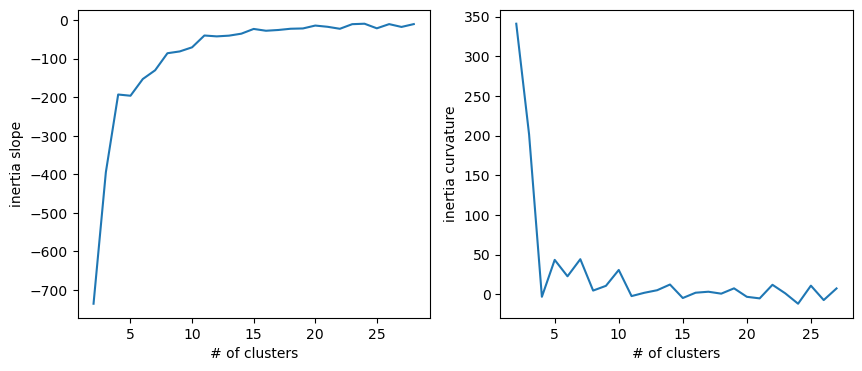

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

axs[0].plot(clusters[:-1], slope)
axs[0].set_xlabel('# of clusters')
axs[0].set_ylabel('inertia slope')

axs[1].plot(clusters[:-2], curve)
axs[1].set_xlabel('# of clusters')
axs[1].set_ylabel('inertia curvature')

In [16]:
random_state = 101

# Initialise the model
kmeans = KMeans(n_clusters = 5, 
                n_init = "auto",
                random_state = random_state)

# Fit the model to the data
kmeans.fit(scaled_df)

# Obtain the cluster output
clusters = kmeans.labels_

# Attach the cluster output to our original DataFrame
scaled_df["cluster"] = clusters

scaled_df.head(10)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,0.680455,0.2590,1.000000,0.763897,0.0,0.375000,0.696787,0.000060,0.987842,0.310660,0.515800,3
1,0.767322,0.3990,0.181818,0.771967,1.0,0.184043,0.217871,0.000002,0.108409,0.703553,0.584322,1
3,0.729059,0.0502,0.363636,0.682811,1.0,0.250532,0.882530,0.000041,0.391084,0.531980,0.499098,1
4,0.673216,0.1190,0.545455,0.655228,1.0,0.202128,0.919679,0.000348,0.105370,0.408122,0.565171,4
5,0.481903,0.1460,0.272727,0.692837,1.0,0.345213,0.934739,0.156345,0.108409,0.429442,0.667718,4
6,0.698035,0.2070,1.000000,0.752828,0.0,0.289894,0.966867,0.420305,0.113475,0.694416,0.437081,4
8,0.717684,0.5460,0.909091,0.791432,1.0,0.212766,0.399598,0.077157,0.155015,0.650761,0.794579,0
9,0.697001,0.8640,0.090909,0.848179,1.0,0.203191,0.643574,0.363452,0.140831,0.544162,0.467288,1
10,0.662875,0.1400,0.727273,0.704411,1.0,0.207447,0.870482,0.001685,0.106383,0.393909,0.604318,0
11,0.496381,0.4330,0.454545,0.816586,0.0,0.282979,0.610442,0.704569,0.109422,0.910660,0.384668,3


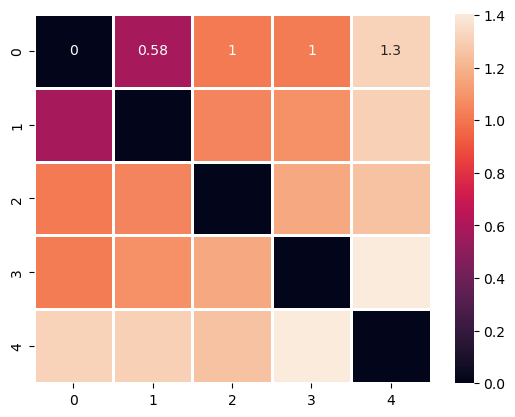

In [17]:
# Find the coordinates of each centroid using the cluster_centers_ attribute
centroids = kmeans.cluster_centers_

# Calculate the euclidean distance between the centroids
centroid_distances = pairwise_distances(centroids)

# Plot distances on heatmap
sns.heatmap(centroid_distances,
            annot=True,
            linewidths=1);

In [18]:
combined = pd.concat([df_general, scaled_df], axis=1)
combined.cluster.value_counts()
#combined#.loc[combined.cluster == 5]

cluster
3    1195
0    1001
1     995
2     772
4     770
Name: count, dtype: int64

In [19]:
scaled_df.groupby('cluster').agg(['mean'])#, 'std'])

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
cluster,,,,,,,,,,,
0,0.601950,0.704850,0.731995,0.860367,1.000000,0.342513,0.220034,0.033724,0.189520,0.556960,0.563557
1,0.612494,0.680151,0.156327,0.853395,1.000000,0.315166,0.262251,0.033616,0.184695,0.590857,0.565529
2,0.286997,0.899771,0.449246,0.843465,0.744819,0.498840,0.009674,0.790660,0.209253,0.246609,0.572398
3,0.631063,0.714625,0.555496,0.864022,0.000000,0.364700,0.201009,0.081802,0.195397,0.529409,0.562345
4,0.342455,0.137745,0.467178,0.636487,0.663636,0.239078,0.932968,0.694601,0.144070,0.180150,0.491005


/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

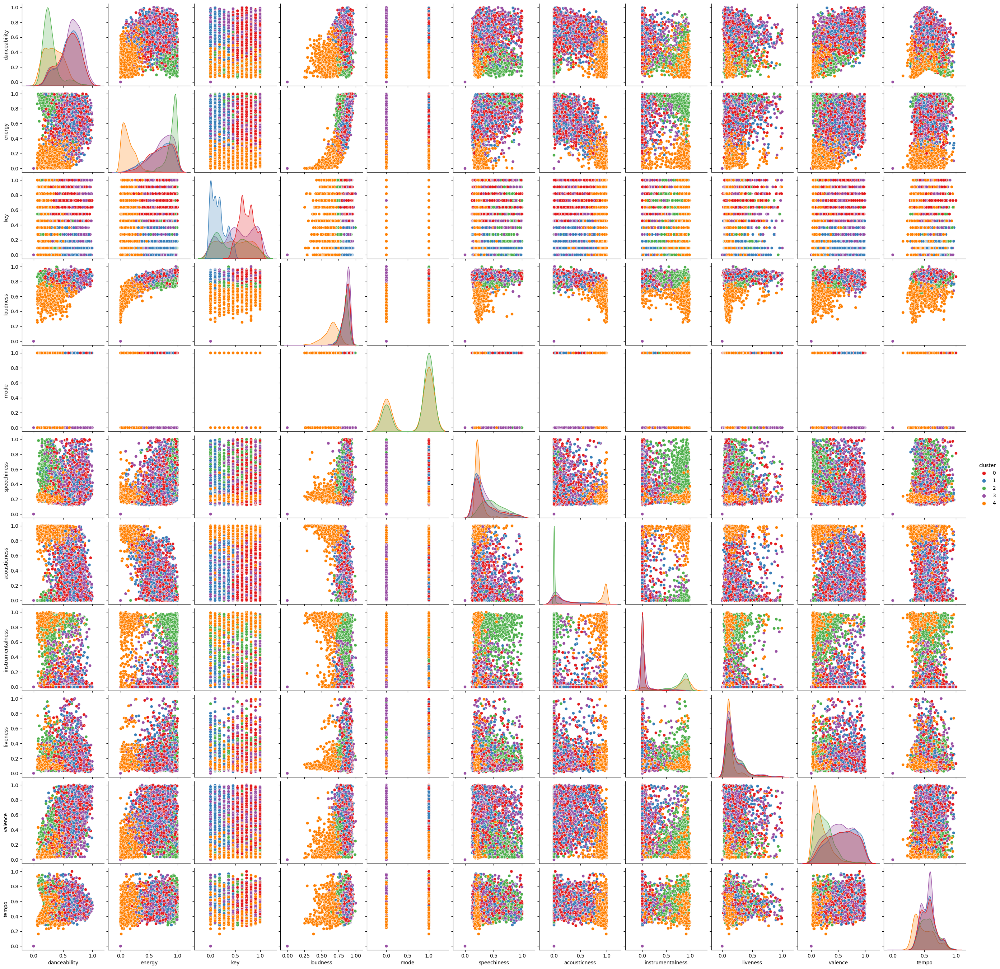

In [20]:
# turned off by default for better performance
#sns.pairplot(scaled_df, hue='cluster', palette='Set1')

# Define major clusters

From visual inspection of all parameter pairs, 4 parameters appear especially distinctive for cluster separation:

In [21]:
coarse_metrics = ['danceability', 'energy', 
           'acousticness', 'instrumentalness']

In [25]:
df_unused = scaled_df.loc[:, ~scaled_df.columns.isin(coarse_metrics)].copy()
df_coarse = scaled_df.loc[:, scaled_df.columns.isin(coarse_metrics)].copy()
df_coarse.describe()

,danceability,energy,acousticness,instrumentalness
count,4733.000000,4733.000000,4733.000000,4733.000000
mean,0.517929,0.641658,0.305779,0.276820
std,0.222358,0.294959,0.366433,0.382888
min,0.000000,0.000000,0.000000,0.000000
25%,0.314374,0.451000,0.002329,0.000002
50%,0.546019,0.729000,0.103414,0.003604
75%,0.698035,0.890000,0.625502,0.713706
max,1.000000,1.000000,1.000000,1.000000


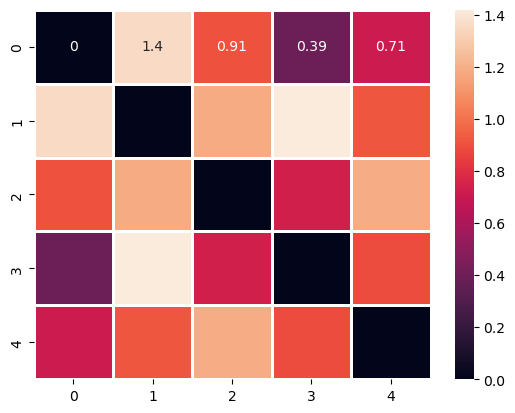

In [23]:
random_state = 101

# Initialise the model
kmeans = KMeans(n_clusters = 5, 
                n_init = "auto",
                random_state = random_state)

# Fit the model to the data
kmeans.fit(df_coarse)

# Obtain the cluster output
clusters = kmeans.labels_

# Attach the cluster output to our original DataFrame
df_coarse["cluster"] = clusters

# Find the coordinates of each centroid using the cluster_centers_ attribute
centroids = kmeans.cluster_centers_

# Calculate the euclidean distance between the centroids
centroid_distances = pairwise_distances(centroids)

# Plot distances on heatmap
sns.heatmap(centroid_distances,
            annot=True,
            linewidths=1);

/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

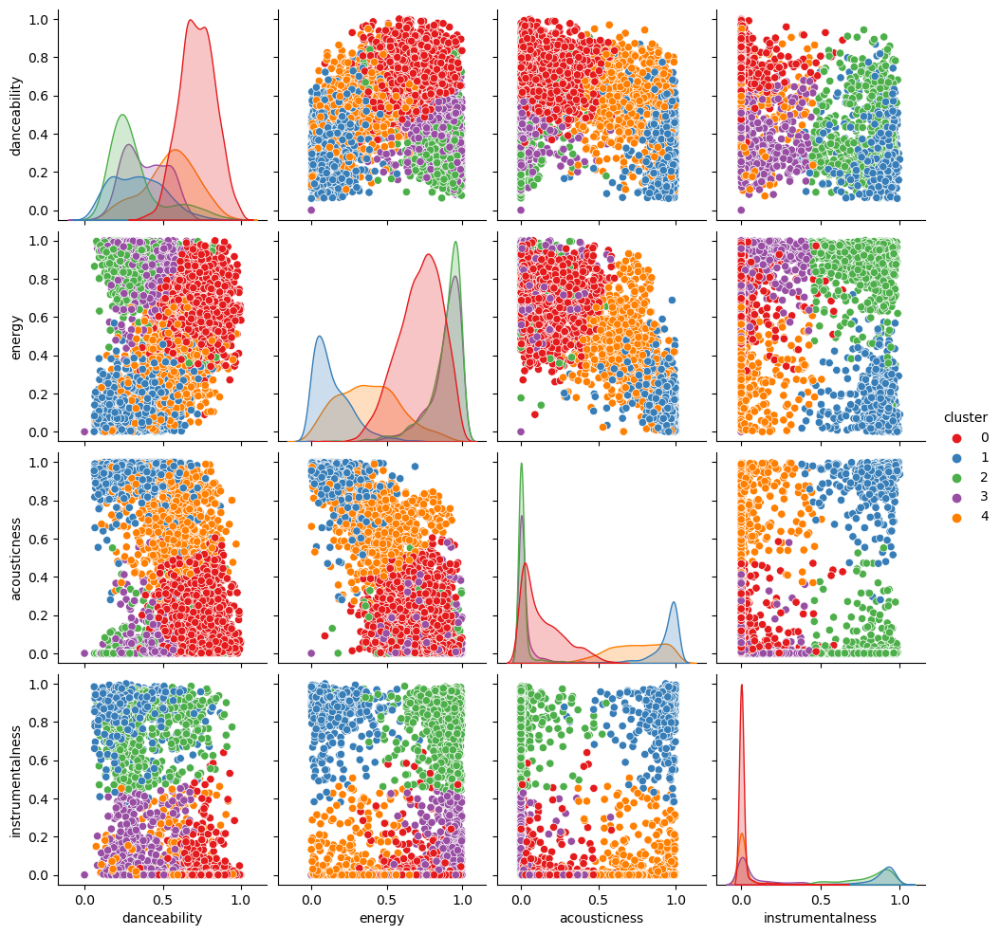

In [24]:
sns.pairplot(df_coarse, hue='cluster', palette='Set1')

In [27]:
df_coarse_combined = pd.concat([df_coarse, df_unused], axis=1)
df_coarse_combined.cluster.value_counts()

cluster
3    1195
0    1001
1     995
2     772
4     770
Name: count, dtype: int64

In [31]:
df_coarse_combined.head()

,danceability,energy,acousticness,instrumentalness,key,loudness,mode,speechiness,liveness,valence,tempo,cluster
0,0.680455,0.2590,0.696787,0.000060,1.000000,0.763897,0.0,0.375000,0.987842,0.310660,0.515800,3
1,0.767322,0.3990,0.217871,0.000002,0.181818,0.771967,1.0,0.184043,0.108409,0.703553,0.584322,1
3,0.729059,0.0502,0.882530,0.000041,0.363636,0.682811,1.0,0.250532,0.391084,0.531980,0.499098,1
4,0.673216,0.1190,0.919679,0.000348,0.545455,0.655228,1.0,0.202128,0.105370,0.408122,0.565171,4
5,0.481903,0.1460,0.934739,0.156345,0.272727,0.692837,1.0,0.345213,0.108409,0.429442,0.667718,4


In [32]:
df_coarse_combined.cluster.unique()

array([3, 1, 4, 0, 2], dtype=int32)

In [33]:
cl = df_coarse_combined.loc[df_coarse_combined.cluster == 0]
cl

,danceability,energy,acousticness,instrumentalness,key,loudness,mode,speechiness,liveness,valence,tempo,cluster
8,0.717684,0.546,0.399598,0.077157,0.909091,0.791432,1.0,0.212766,0.155015,0.650761,0.794579,0
10,0.662875,0.140,0.870482,0.001685,0.727273,0.704411,1.0,0.207447,0.106383,0.393909,0.604318,0
15,0.618407,0.739,0.525100,0.736041,0.727273,0.805288,1.0,0.240426,0.147923,0.894416,0.444030,0
29,0.560496,0.224,0.777108,0.090051,0.545455,0.715236,1.0,0.316489,0.115502,0.540102,0.372447,0
31,0.640124,0.402,0.873494,0.071269,0.636364,0.789687,1.0,0.188298,0.098683,0.804061,0.435707,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5125,0.293692,0.497,0.104418,0.000000,0.909091,0.845995,1.0,0.442021,0.064944,0.224365,0.820361,0
5130,0.595657,0.562,0.623494,0.000000,0.909091,0.844642,1.0,0.484043,0.113475,0.518782,0.635721,0
5131,0.507756,0.958,0.007490,0.000034,0.909091,0.918636,1.0,0.750000,0.657548,0.349239,0.701439,0
5133,0.331954,0.486,0.630522,0.000000,0.636364,0.837452,1.0,0.195745,0.356636,0.272081,0.568844,0


In [35]:
wcss = []
clusters = []
silhouettes = []

for k in range(2, 30):
    kmeans = KMeans(n_clusters=k, 
                    #init='random',
                    init='k-means++',
                    n_init=10,
                    #n_init='auto',
                    max_iter=300,
                    random_state=101)
    kmeans.fit(cl)
    wcss.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(cl, kmeans.labels_))
    clusters.append(k)
    #print(kmeans.n_iter_)

#print(clusters, wcss)

In [36]:
slope = np.diff(wcss)
curve = np.diff(slope)
elbow = np.argmax(curve) + 1
print(clusters[elbow])

3


Text(0, 0.5, 'silhouette score')

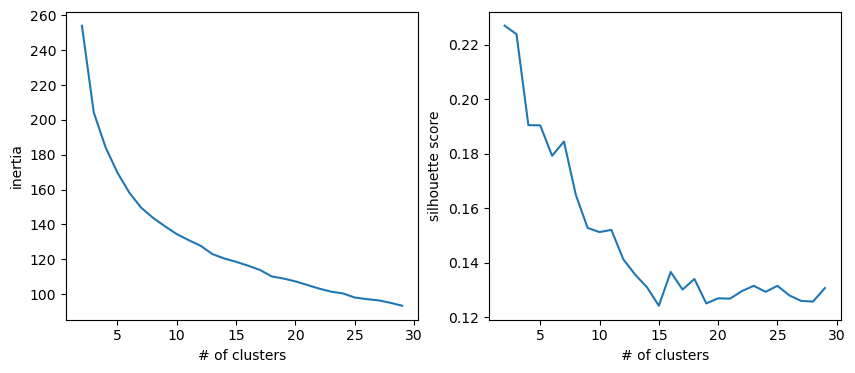

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

axs[0].plot(clusters, wcss)
axs[0].set_xlabel('# of clusters')
axs[0].set_ylabel('inertia')

axs[1].plot(clusters, silhouettes)
axs[1].set_xlabel('# of clusters')
axs[1].set_ylabel('silhouette score')

/tmp/ipykernel_20572/3927255028.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl["cluster"] = clusters


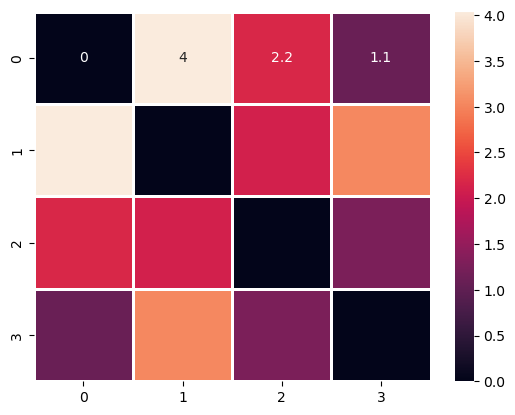

In [40]:
random_state = 101

# Initialise the model
kmeans = KMeans(n_clusters = 4, 
                n_init = "auto",
                random_state = random_state)

# Fit the model to the data
kmeans.fit(cl)

# Obtain the cluster output
clusters = kmeans.labels_

# Attach the cluster output to our original DataFrame
cl["cluster"] = clusters

# Find the coordinates of each centroid using the cluster_centers_ attribute
centroids = kmeans.cluster_centers_

# Calculate the euclidean distance between the centroids
centroid_distances = pairwise_distances(centroids)

# Plot distances on heatmap
sns.heatmap(centroid_distances,
            annot=True,
            linewidths=1);

/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/philip/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

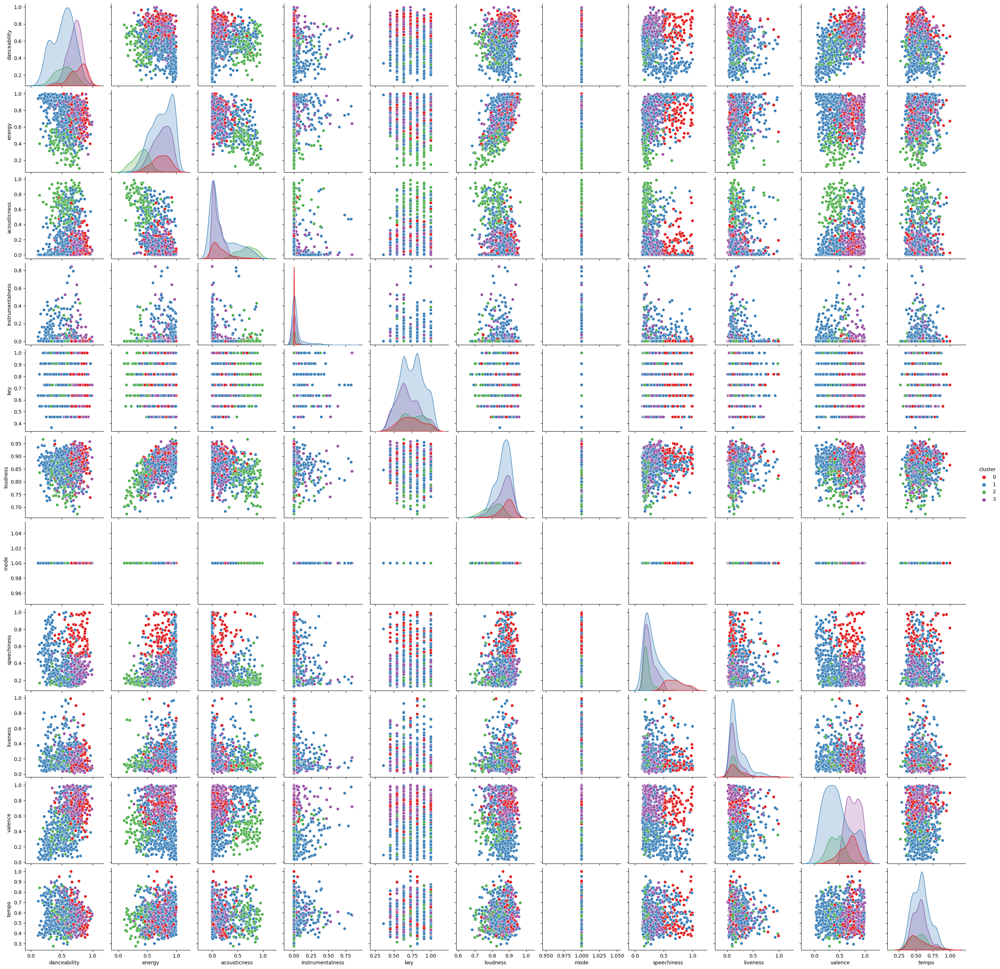

In [41]:
sns.pairplot(cl, hue='cluster', palette='Set1')